In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_wine

# Load the Wine Quality dataset
wine = load_wine()
X = wine.data  # Features
y = wine.target  # Target variable (wine quality score)
feature_names = wine.feature_names

# Convert to a DataFrame for better visualization
df = pd.DataFrame(X, columns=feature_names)
df["quality"] = y  # Add target variable

# Show first few rows
df.head()


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,quality
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [2]:
# Summary statistics
df.describe()


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,quality
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,0.938202
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.775035
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,0.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,0.000000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,1.000000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,2.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,2.000000


In [3]:
print(df.isnull().sum())  # Should be all zeros (no missing values)


alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
quality                         0
dtype: int64


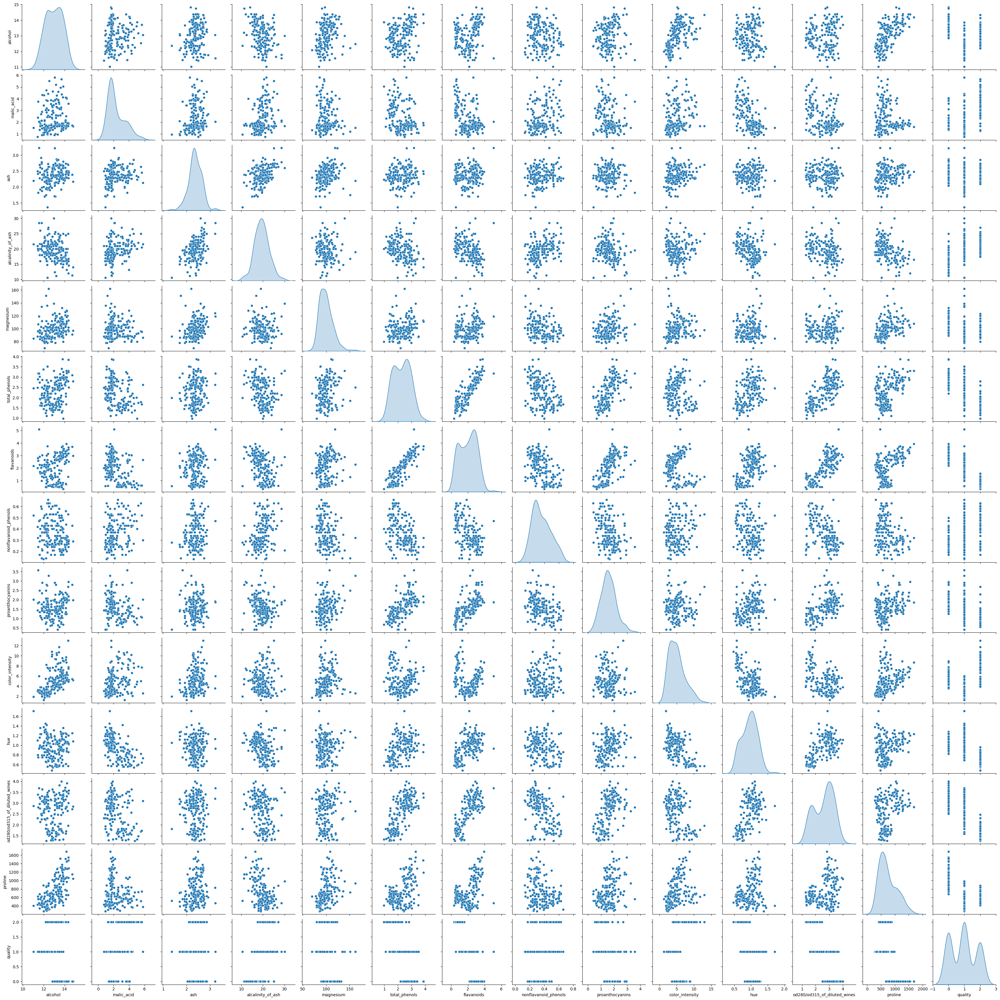

In [4]:
# Pairplot to visualize relationships
sns.pairplot(df, diag_kind='kde')
plt.show()


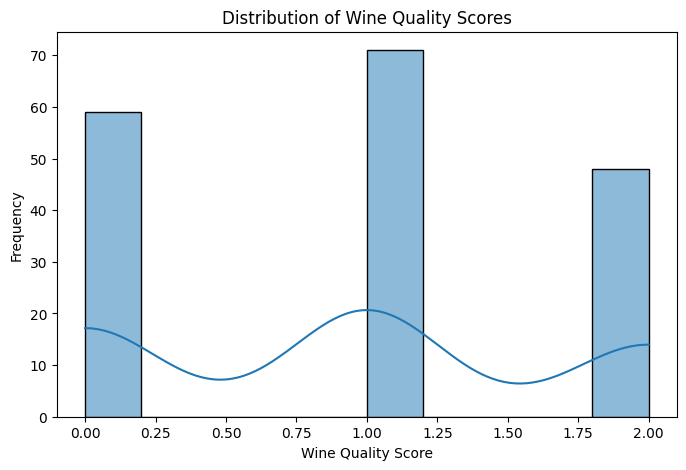

In [5]:
# Distribution of wine quality scores
plt.figure(figsize=(8,5))
sns.histplot(df["quality"], bins=10, kde=True)
plt.xlabel("Wine Quality Score")
plt.ylabel("Frequency")
plt.title("Distribution of Wine Quality Scores")
plt.show()


In [6]:
from sklearn.model_selection import train_test_split

# Split dataset
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42
)

# Print dataset sizes
print("Training set:", X_train.shape)
print("Validation set:", X_val.shape)
print("Test set:", X_test.shape)


Training set: (124, 13)
Validation set: (27, 13)
Test set: (27, 13)


In [7]:
from sklearn.preprocessing import StandardScaler

# Apply StandardScaler (mean = 0, std = 1)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 32)                  │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 993 (3.88 KB)

 Trainable params: 993 (3.88 KB)

 Non-trainable params: 0 (0.00 B)

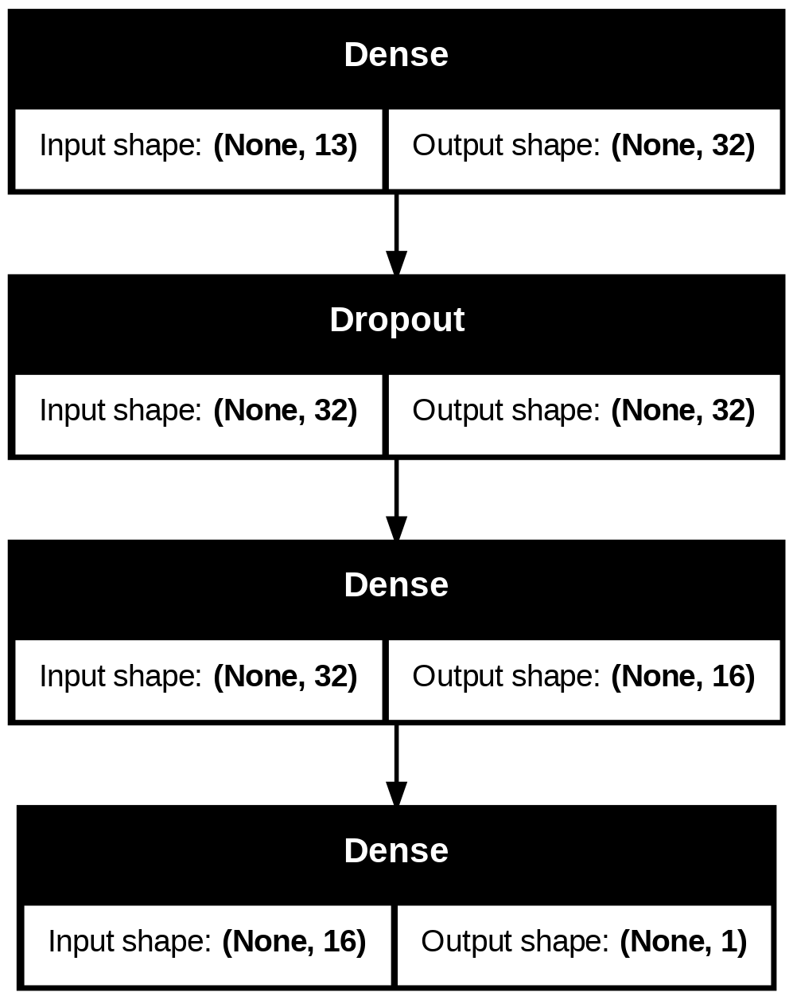

In [8]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import plot_model

# Define Regression Model
model = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dense(1, activation='linear')  # Output layer for regression
])

# Compile Model
model.compile(optimizer='adam',
              loss='mean_squared_error',  # MSE for regression
              metrics=['mae'])  # Mean Absolute Error

# Model Summary
model.summary()

# Plot Model Architecture
plot_model(model, to_file='wine_regression_model.png', show_shapes=True)


In [9]:
import tensorflow as tf
import datetime

# Define log directory
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


In [10]:
history = model.fit(
    X_train_scaled, y_train,
    validation_data=(X_val_scaled, y_val),
    epochs=100,
    batch_size=8,
    callbacks=[tensorboard_callback]  # TensorBoard callback
)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 1.7568 - mae: 1.0451 - val_loss: 0.9921 - val_mae: 0.6842
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0518 - mae: 0.7594 - val_loss: 0.5986 - val_mae: 0.5237
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6169 - mae: 0.5838 - val_loss: 0.3702 - val_mae: 0.4218
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.4131 - mae: 0.5044 - val_loss: 0.2467 - val_mae: 0.3792
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2910 - mae: 0.4244 - val_loss: 0.1959 - val_mae: 0.3635
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2630 - mae: 0.4184 - val_loss: 0.1686 - val_mae: 0.3442
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2163 - mae: 0.3777 - val_loss: 0.1515 - val_mae: 0.3298
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2153 - mae: 0.3525 - val_loss: 0.1354 - val_mae: 0.3097
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.19

In [11]:
# Load TensorBoard extension
%load_ext tensorboard

# Start TensorBoard
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

In [12]:
test_loss, test_mae = model.evaluate(X_test_scaled, y_test)
print(f"Test Loss (MSE): {test_loss:.4f}, Test MAE: {test_mae:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0354 - mae: 0.1341
Test Loss (MSE): 0.0354, Test MAE: 0.1341


In [13]:
y_pred = model.predict(X_test_scaled)

# Print sample predictions
print("Actual Quality Scores:", y_test[:10])
print("Predicted Quality Scores:", y_pred[:10].flatten())


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Actual Quality Scores: [1 0 2 0 2 0 1 0 0 2]
Predicted Quality Scores: [ 0.90445304 -0.01956348  1.8857464   0.09406625  1.6390382   0.08386774
  0.9904238   0.07641771  0.1243865   1.6620053 ]


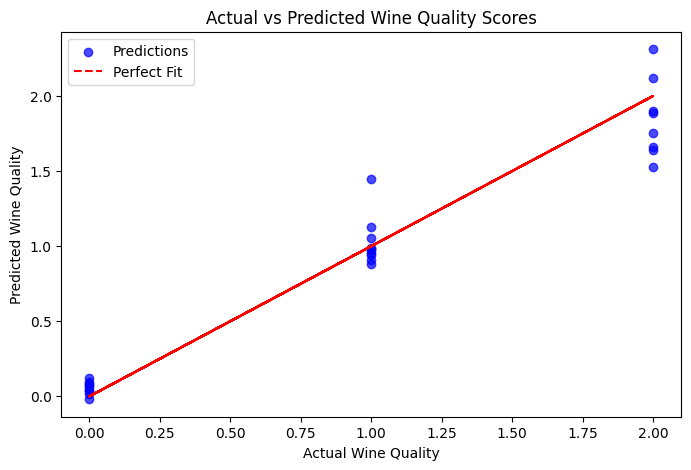

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.scatter(y_test, y_pred, alpha=0.7, color="blue", label="Predictions")
plt.plot(y_test, y_test, color="red", linestyle="dashed", label="Perfect Fit")  # y=x line
plt.xlabel("Actual Wine Quality")
plt.ylabel("Predicted Wine Quality")
plt.title("Actual vs Predicted Wine Quality Scores")
plt.legend()
plt.show()


In [16]:
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Compute R² Score
r2 = r2_score(y_test, y_pred)

# Compute RMSE manually (square root of MSE)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")


R² Score: 0.9436
RMSE: 0.1882


In [17]:
model.save("wine_quality_regression_model.h5")


In [18]:
import json

metrics = {
    "Test MSE": test_loss,
    "Test MAE": test_mae,
    "R² Score": r2,
    "RMSE": rmse
}

# Save as JSON file
with open("regression_metrics.json", "w") as f:
    json.dump(metrics, f, indent=4)

print("Regression metrics saved!")


Regression metrics saved!


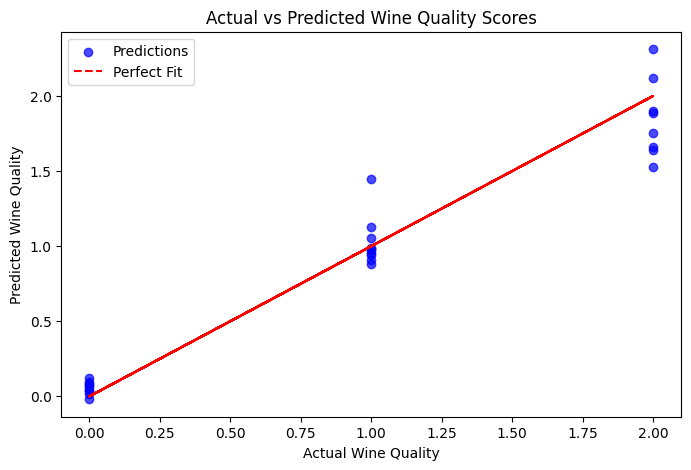

In [19]:
plt.figure(figsize=(8,5))
plt.scatter(y_test, y_pred, alpha=0.7, color="blue", label="Predictions")
plt.plot(y_test, y_test, color="red", linestyle="dashed", label="Perfect Fit")
plt.xlabel("Actual Wine Quality")
plt.ylabel("Predicted Wine Quality")
plt.title("Actual vs Predicted Wine Quality Scores")
plt.legend()
plt.savefig("regression_predictions.png")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


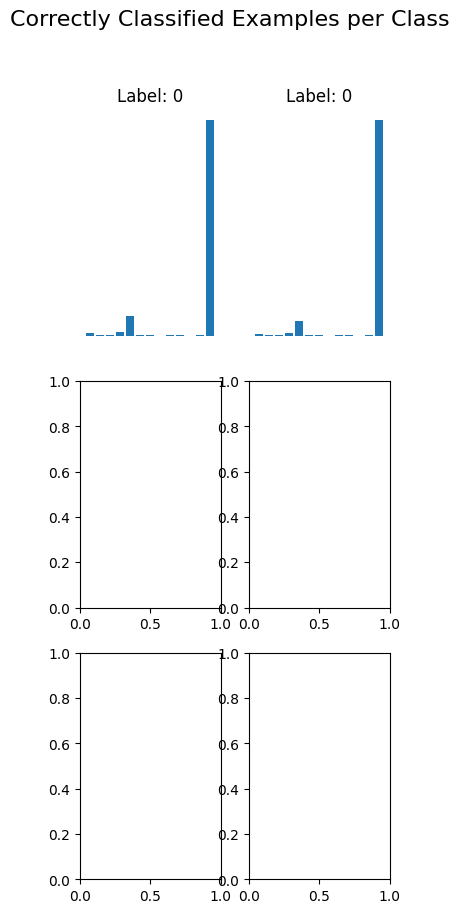

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.metrics import confusion_matrix

# Get model predictions
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)  # Predicted class labels
y_true = y_test  # True labels (already categorical)

# Function to display correctly classified samples per class
def display_correctly_classified(n_per_class=2):
    fig, axes = plt.subplots(3, n_per_class, figsize=(n_per_class * 2, 10))
    fig.suptitle("Correctly Classified Examples per Class", fontsize=16)

    for class_label in range(3):
        correct_indices = np.where((y_true == class_label) & (y_pred == class_label))[0]
        chosen_indices = np.random.choice(correct_indices, min(n_per_class, len(correct_indices)), replace=False)

        for j, idx in enumerate(chosen_indices):
            ax = axes[class_label, j]
            ax.bar(range(len(X_test[idx])), X_test[idx])
            ax.set_title(f"Label: {class_label}")
            ax.axis("off")

    plt.show()

display_correctly_classified()


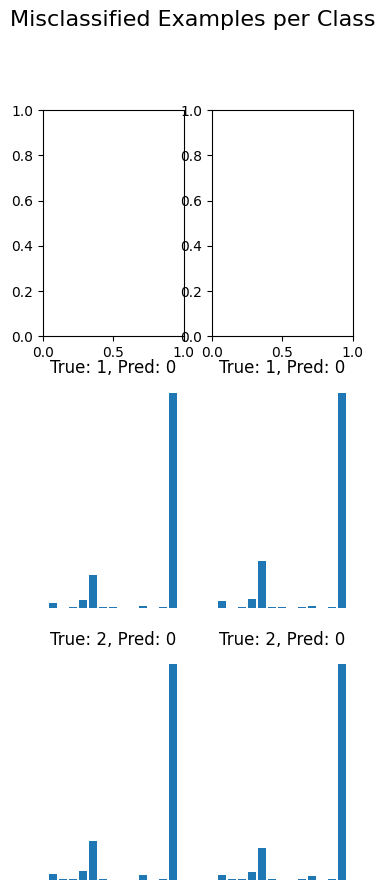

In [22]:
# Function to display misclassified examples per class
def display_misclassified(n_per_class=2):
    fig, axes = plt.subplots(3, n_per_class, figsize=(n_per_class * 2, 10))
    fig.suptitle("Misclassified Examples per Class", fontsize=16)

    for class_label in range(3):
        misclassified_indices = np.where((y_true == class_label) & (y_pred != class_label))[0]
        if len(misclassified_indices) > 0:
            chosen_indices = np.random.choice(misclassified_indices, min(n_per_class, len(misclassified_indices)), replace=False)

            for j, idx in enumerate(chosen_indices):
                ax = axes[class_label, j]
                ax.bar(range(len(X_test[idx])), X_test[idx])
                ax.set_title(f"True: {y_true[idx]}, Pred: {y_pred[idx]}")
                ax.axis("off")

    plt.show()

display_misclassified()


Most common misclassified classes: Counter({1: 10, 2: 8})


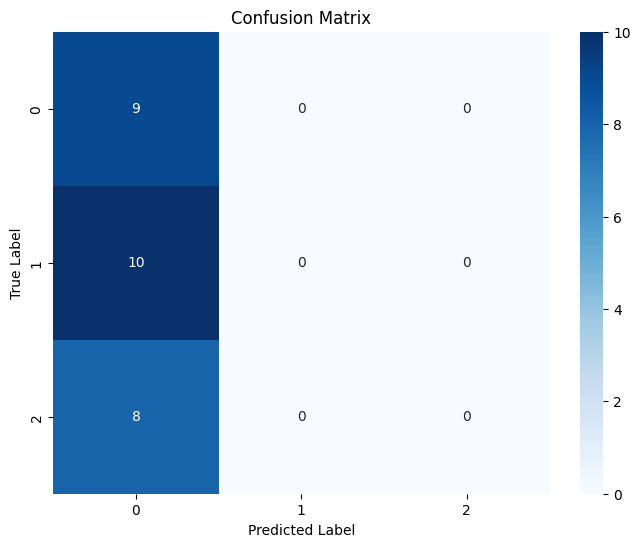

In [23]:
# Count misclassified instances per class
misclassified_counts = Counter(y_true[y_true != y_pred])
print("Most common misclassified classes:", misclassified_counts)

# Display confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()



📌 **Dataset Name Here Per-Class Error Rates**
   Class  Error Rate
0      0         0.0
1      1         1.0
2      2         1.0


<ipython-input-30-002e518e46d5>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df_error["Class"], y=df_error["Error Rate"], palette="Blues")


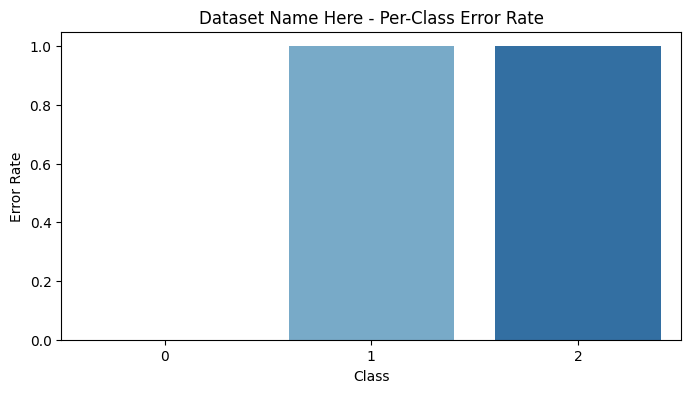

In [30]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def per_class_error_analysis(y_true, y_pred, dataset_name):
    cm = confusion_matrix(y_true, y_pred)

    error_rates = []
    for i in range(len(cm)):
        total = sum(cm[i])
        correct = cm[i][i]
        error = total - correct
        error_rate = error / total if total != 0 else 0
        error_rates.append(error_rate)

    df_error = pd.DataFrame({
        "Class": range(len(cm)),
        "Error Rate": error_rates
    })

    print(f"\n📌 **{dataset_name} Per-Class Error Rates**")
    print(df_error)

    plt.figure(figsize=(8, 4))
    sns.barplot(x=df_error["Class"], y=df_error["Error Rate"], palette="Blues")
    plt.xlabel("Class")
    plt.ylabel("Error Rate")
    plt.title(f"{dataset_name} - Per-Class Error Rate")
    plt.show()

# Run per-class error analysis
per_class_error_analysis(y_true, y_pred, "Dataset Name Here")


In [31]:
import pandas as pd

# Convert predictions to class labels
y_pred_classes = np.argmax(y_pred_probs, axis=1) if y_pred_probs.ndim > 1 else y_pred

# Store results in DataFrame
df_results = pd.DataFrame(X_test, columns=[f"Feature {i}" for i in range(X_test.shape[1])])
df_results["True Label"] = y_true
df_results["Predicted Label"] = y_pred_classes
df_results["Correct"] = df_results["True Label"] == df_results["Predicted Label"]

# Display Correct Predictions
print("✅ Correctly Classified Examples:")
display(df_results[df_results["Correct"]].head(5))

# Display Incorrect Predictions
print("❌ Misclassified Examples:")
display(df_results[~df_results["Correct"]].head(5))


✅ Correctly Classified Examples:


,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,True Label,Predicted Label,Correct
1,13.83,1.65,2.60,17.2,94.0,2.45,2.99,0.22,2.29,5.60,1.24,3.37,1265.0,0,0,True
3,13.41,3.84,2.12,18.8,90.0,2.45,2.68,0.27,1.48,4.28,0.91,3.00,1035.0,0,0,True
5,14.30,1.92,2.72,20.0,120.0,2.80,3.14,0.33,1.97,6.20,1.07,2.65,1280.0,0,0,True
7,13.39,1.77,2.62,16.1,93.0,2.85,2.94,0.34,1.45,4.80,0.92,3.22,1195.0,0,0,True
8,13.73,1.50,2.70,22.5,101.0,3.00,3.25,0.29,2.38,5.70,1.19,2.71,1285.0,0,0,True


❌ Misclassified Examples:


,Feature 0,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10,Feature 11,Feature 12,True Label,Predicted Label,Correct
0,12.08,1.39,2.50,22.5,84.0,2.56,2.29,0.43,1.04,2.9,0.93,3.19,385.0,1,0,False
2,12.58,1.29,2.10,20.0,103.0,1.48,0.58,0.53,1.40,7.6,0.58,1.55,640.0,2,0,False
4,13.62,4.95,2.35,20.0,92.0,2.00,0.80,0.47,1.02,4.4,0.91,2.05,550.0,2,0,False
6,12.08,1.13,2.51,24.0,78.0,2.00,1.58,0.40,1.40,2.2,1.31,2.72,630.0,1,0,False
9,13.16,3.57,2.15,21.0,102.0,1.50,0.55,0.43,1.30,4.0,0.60,1.68,830.0,2,0,False
